In [68]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import numpy as np

In [69]:
data = pd.read_csv('data.csv')
L = [i.strip() for i in list(data.keys())]
data.columns = L

In [70]:
S = [i.strip() for i in list(data['name'])]
data['name'] = S

In [71]:
# Convert numeric columns, keeping original column names
numeric_columns = ['price_ingame', 'cargo_capacity', 'mass', 'price', 'scm', 'max', 'length', 'beam', 'height']

for col in numeric_columns:
    # Find the matching column name with potential trailing spaces
    matching_col = [c for c in data.columns if c.strip() == col][0]
    # Convert to numeric and assign back to clean column name
    data[col] = pd.to_numeric(data[matching_col], errors='coerce')

In [72]:
# Obtenir la liste unique des types de vaisseaux
types_vaisseaux = data['type'].unique()

# Créer un dictionnaire pour stocker les différents DataFrames
df_by_type = {}

# Créer un DataFrame pour chaque type de vaisseau
for type_vaisseau in types_vaisseaux:
    df_by_type[type_vaisseau] = data[data['type'] == type_vaisseau].copy()

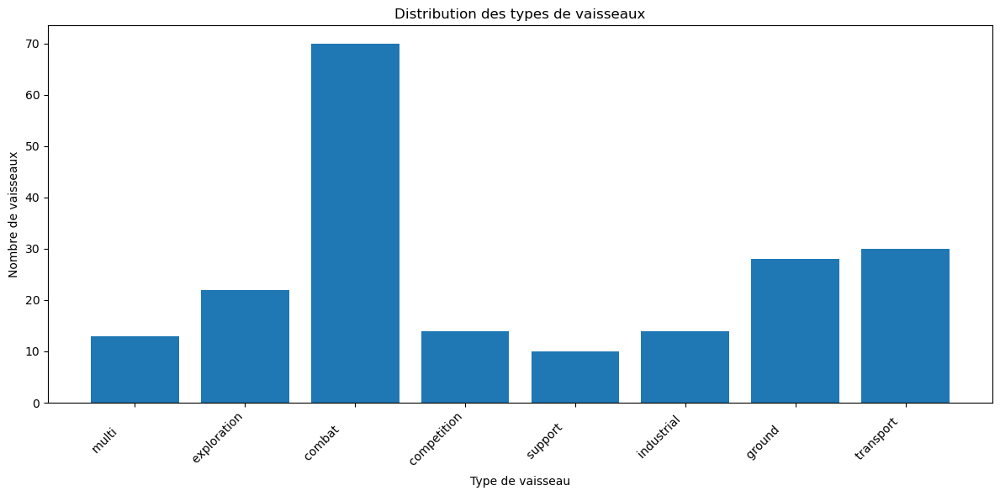

In [73]:
import matplotlib.pyplot as plt

# Préparer les données pour l'histogramme
types = list(df_by_type.keys())
counts = [len(df) for df in df_by_type.values()]

# Créer la figure avec une taille personnalisée
plt.figure(figsize=(12, 6))

# Créer l'histogramme
plt.bar(types, counts)

# Personnaliser le graphique
plt.title('Distribution des types de vaisseaux')
plt.xlabel('Type de vaisseau')
plt.ylabel('Nombre de vaisseaux')

# Rotation des labels sur l'axe x pour une meilleure lisibilité
plt.xticks(rotation=45, ha='right')

# Ajuster automatiquement les marges
plt.tight_layout()

# Afficher le graphique
plt.show()

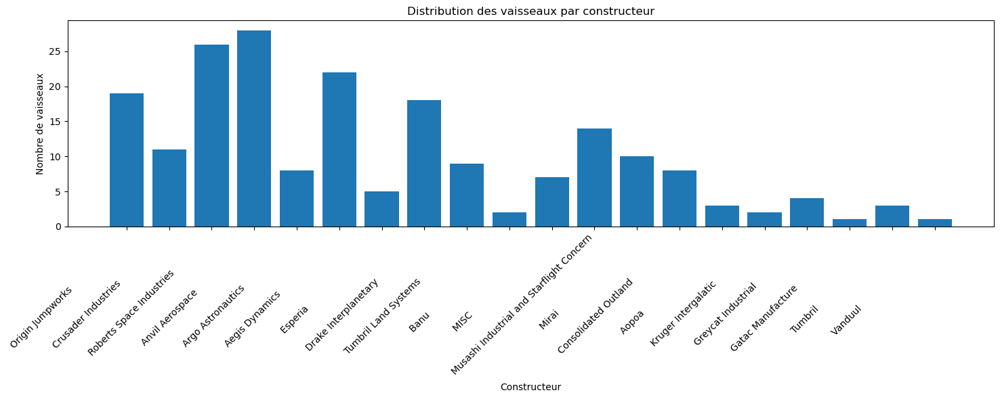

In [81]:
# Obtenir la liste unique des constructeurs
constructeurs = data['manufacturer'].unique()

# Créer un dictionnaire pour stocker les différents DataFrames
df_by_manufacturer = {}

# Créer un DataFrame pour chaque constructeur
for constructeur in constructeurs:
    df_by_manufacturer[constructeur] = data[data['manufacturer'] == constructeur].copy()

# Visualiser la distribution avec un graphique en barres
plt.figure(figsize=(15, 6))
manufacturers = list(df_by_manufacturer.keys())
counts = [len(df) for df in df_by_manufacturer.values()]

plt.bar(manufacturers, counts)
plt.title('Distribution des vaisseaux par constructeur')
plt.xlabel('Constructeur')
plt.ylabel('Nombre de vaisseaux')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [75]:
# Créer un dictionnaire pour stocker les vaisseaux par rôle
ships_by_role = {}

# Pour chaque vaisseau dans le DataFrame
for _, row in data.iterrows():
    # Split les rôles (certains vaisseaux peuvent avoir plusieurs rôles)
    if pd.notna(row['role']):
        role_str = str(row['role'])
        # Vérifier si le rôle est au format dictionnaire
        if role_str.startswith('{'):
            # Extraire les rôles du dictionnaire
            roles = [r.strip().strip("'") for r in role_str.split(':')[1].strip('}').strip().split(',')]
        else:
            # Si le format est différent, essayer de nettoyer la chaîne
            roles = [r.strip().strip('"').strip("'") for r in role_str.split(',')]
        
        # Pour chaque rôle du vaisseau
        for role in roles:
            if role and not role.isspace():  # Vérifier que le rôle n'est pas vide
                # Si le rôle n'existe pas encore dans le dictionnaire, créer une nouvelle liste
                if role not in ships_by_role:
                    ships_by_role[role] = []
                # Ajouter le nom du vaisseau à la liste correspondant à ce rôle
                name = row['name']
                ships_by_role[role].append(name)

In [76]:
# Create a dictionary to store ships by manufacturer
ships_by_manufacturer = {}

# For each row in the DataFrame
for _, row in data.iterrows():
    manufacturer = row['manufacturer']
    ship_name = row['name']
    
    # If manufacturer not in dictionary, create new list
    if manufacturer not in ships_by_manufacturer:
        ships_by_manufacturer[manufacturer] = []
    
    # Add ship name to manufacturer's list
    ships_by_manufacturer[manufacturer].append(ship_name)

In [77]:
path = pd.read_csv('detailed_paths_history.csv')

dist = list(path['total_distance'])

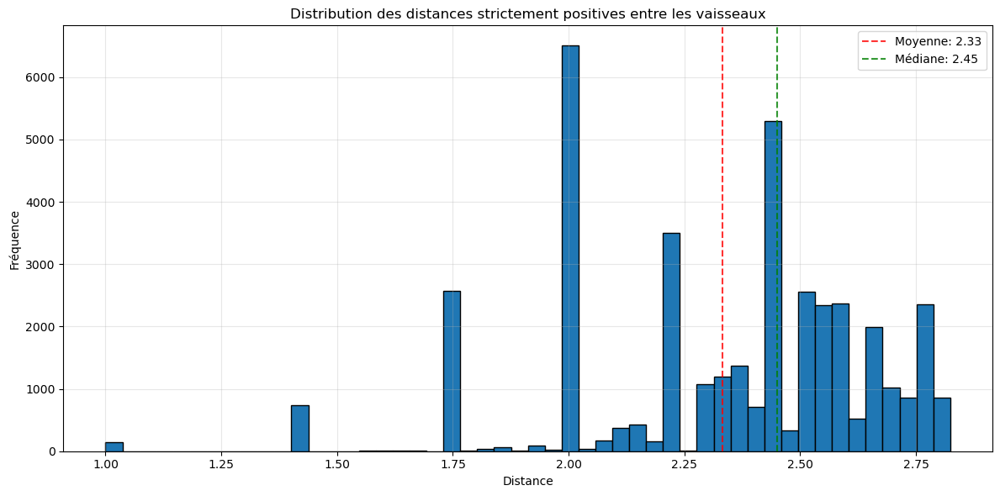

In [78]:
# Filtrer les distances strictement positives
positive_dist = [d for d in dist if d > 0]

# Créer la figure
plt.figure(figsize=(12, 6))

# Créer l'histogramme des distances positives
plt.hist(positive_dist, bins=50, edgecolor='black')

# Personnaliser le graphique
plt.title('Distribution des distances strictement positives entre les vaisseaux')
plt.xlabel('Distance')
plt.ylabel('Fréquence')
plt.grid(True, alpha=0.3)

# Calculer et afficher les statistiques
mean_dist = np.mean(positive_dist)
median_dist = np.median(positive_dist)
std_dist = np.std(positive_dist)

# Ajouter les lignes pour la moyenne et la médiane
plt.axvline(mean_dist, color='red', linestyle='dashed', alpha=0.8, 
            label=f'Moyenne: {mean_dist:.2f}')
plt.axvline(median_dist, color='green', linestyle='dashed', alpha=0.8, 
            label=f'Médiane: {median_dist:.2f}')

# Ajouter la légende et ajuster la mise en page
plt.legend()
plt.tight_layout()

# Afficher le graphique
plt.show()

In [79]:
# Create connections for all roles
manufacturer_edges_by_type = {}
role_edges_by_type = {}  # Dictionary to store edges by role

# Create manufacturer connections
for manufacturer, ships in ships_by_manufacturer.items():
    manufacturer_edges_by_type[manufacturer] = []  # Initialize edge list for this manufacturer
    for i in range(len(ships)):
        for j in range(i + 1, len(ships)):
            manufacturer_edges_by_type[manufacturer].append((ships[i], ships[j], {'type': manufacturer}))

# Create edges for each role separately
for role, ships in ships_by_role.items():
    role_edges_by_type[role] = []  # Initialize edge list for this role
    for i in range(len(ships)):
        for j in range(i + 1, len(ships)):
            role_edges_by_type[role].append((ships[i], ships[j], {'type': role}))

# Flatten all manufacturer edges into a single list
manufacturer_edges = []
for edges in manufacturer_edges_by_type.values():
    manufacturer_edges.extend(edges)

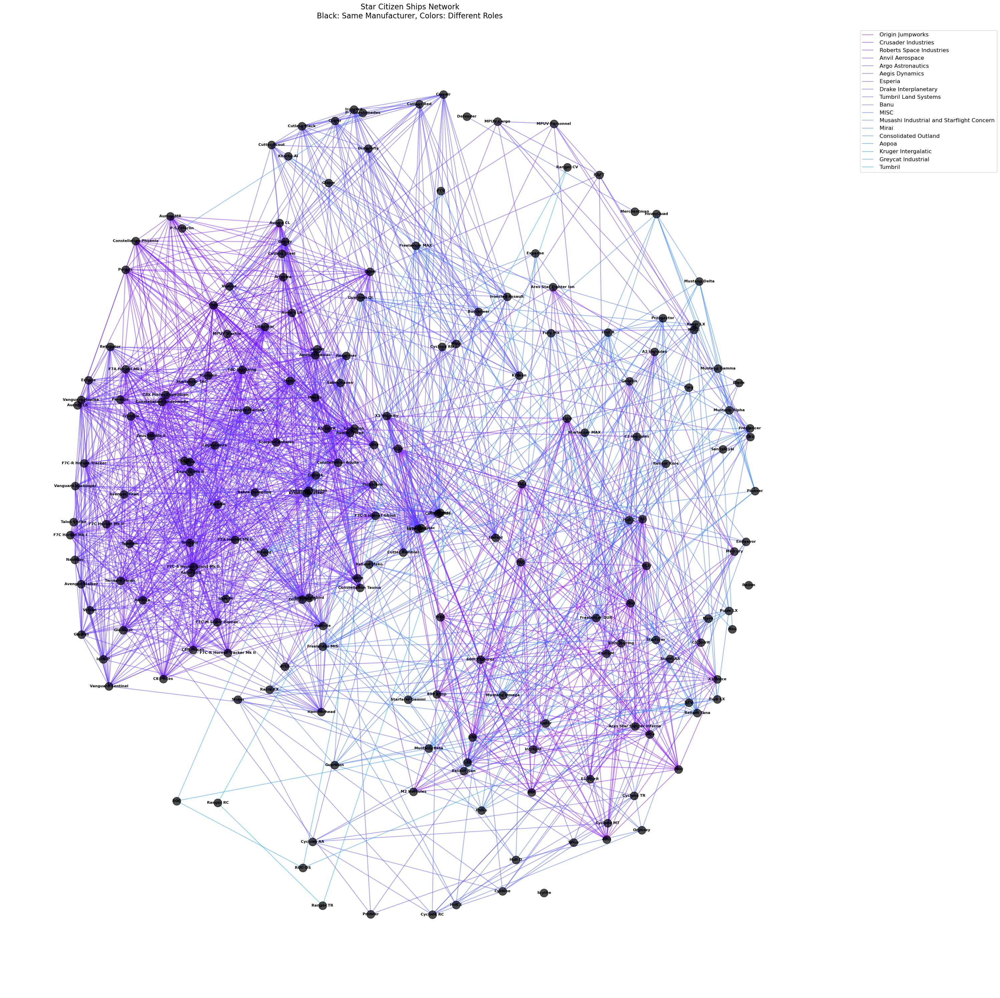

In [80]:
# Create graph
G = nx.Graph()

# Add nodes with all attributes
for _, row in data.iterrows():
    G.add_node(row['name'], 
               manufacturer=row['manufacturer'],
               type=row['type'])
# Add manufacturer edges
for manufacturer_edges in manufacturer_edges_by_type.values():
    G.add_edges_from(manufacturer_edges)

# Add role edges
#for role_edges in role_edges_by_type.values():
    #G.add_edges_from(role_edges)

# Visualization
plt.figure(figsize=(30, 30))
pos = nx.spring_layout(G, k=2, iterations=100)

# Draw nodes
nx.draw_networkx_nodes(G, pos, 
                      node_color='black',
                      node_size=300,
                      alpha=0.7)

# Draw manufacturer edges
colors = plt.cm.rainbow(np.linspace(0, 1, len(role_edges_by_type)))
for (role, edges), color in zip(manufacturer_edges_by_type.items(), colors):
    edge_list = [(u, v) for (u, v, d) in edges]
    nx.draw_networkx_edges(G, pos, 
                          edgelist=edge_list,
                          edge_color=[color], alpha=0.5, width=1.5,
                          label=role)
# Draw role edges with different colors
"""colors = plt.cm.rainbow(np.linspace(0, 1, len(role_edges_by_type)))
for (role, edges), color in zip(role_edges_by_type.items(), colors):
    edge_list = [(u, v) for (u, v, d) in edges]
    nx.draw_networkx_edges(G, pos, 
                          edgelist=edge_list,
                          edge_color=[color], alpha=0.5, width=1.5,
                          label=role)"""

# Add labels
nx.draw_networkx_labels(G, pos, font_size=8, font_weight='bold')

# Add legend
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

plt.title("Star Citizen Ships Network\nBlack: Same Manufacturer, Colors: Different Roles", 
         fontsize=16, pad=20)
plt.axis('off')
plt.tight_layout()
plt.show()

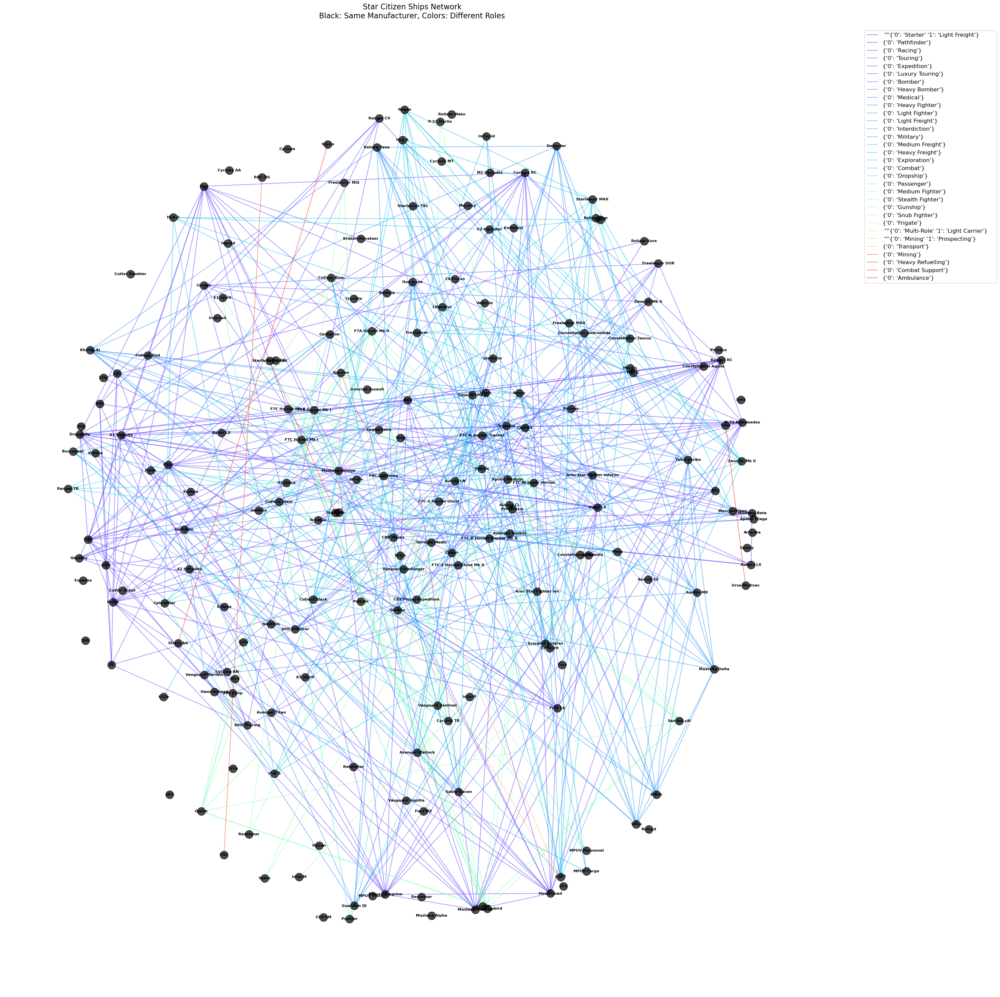

In [82]:
# Create graph
G = nx.Graph()

# Add nodes with all attributes
for _, row in data.iterrows():
    G.add_node(row['name'], 
               manufacturer=row['manufacturer'],
               type=row['type'])
# Add manufacturer edges
for manufacturer_edges in manufacturer_edges_by_type.values():
    G.add_edges_from(manufacturer_edges)

# Add role edges
#for role_edges in role_edges_by_type.values():
    #G.add_edges_from(role_edges)

# Visualization
plt.figure(figsize=(30, 30))
pos = nx.spring_layout(G, k=2, iterations=100)

# Draw nodes
nx.draw_networkx_nodes(G, pos, 
                      node_color='black',
                      node_size=300,
                      alpha=0.7)



# Draw role edges with different colors
colors = plt.cm.rainbow(np.linspace(0, 1, len(role_edges_by_type)))
for (role, edges), color in zip(role_edges_by_type.items(), colors):
    edge_list = [(u, v) for (u, v, d) in edges]
    nx.draw_networkx_edges(G, pos, 
                          edgelist=edge_list,
                          edge_color=[color], alpha=0.5, width=1.5,
                          label=role)

# Add labels
nx.draw_networkx_labels(G, pos, font_size=8, font_weight='bold')

# Add legend
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

plt.title("Star Citizen Ships Network\nBlack: Same Manufacturer, Colors: Different Roles", 
         fontsize=16, pad=20)
plt.axis('off')
plt.tight_layout()
plt.show()